In [1]:
import sys
sys.path.append('Fit-SNE-master')

In [2]:
# import libraries
import pandas as pd
import numpy as np

import random
import pickle
import itertools
import matplotlib.pyplot as plt
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import seaborn as sns
from fast_tsne import fast_tsne

In [3]:
!pwd

/home/nandy/repository/git/agp_analysis


In [4]:
def diff(li1, li2): 
    li_dif = [i for i in li1 + li2 if i not in li1 or i not in li2] 
    return li_dif 

In [3]:
# column names
data_path = 'data'
fuel_cols = ['wind', 'solar', 'solar_rooftop','blackcoal', 'browncoal','gas','diesel','kerosene','hydro','bagasse','batterys', 'net_import']

### Load data

In [4]:
# df = pd.read_pickle('data/train.pkl').dropna()
df = pd.read_pickle('data/nem_formatted_data.pkl')
df = df.sort_values(['state', 'datetime'])
X = df[fuel_cols]
df.head(2)

,state,datetime,bagasse,batterys,blackcoal,browncoal,diesel,gas,hydro,kerosene,solar,solar_rooftop,wind,demand,rrp,year,net_import,export
0,NSW1,2010-11-01,0.0,0.0,63.947452,0.0,0.0,7.772444,9.762840,0.0,0.0,0.0,0.649972,200351.195,20.665106,2010,17.867292,0.0
1,NSW1,2010-11-02,0.0,0.0,69.289126,0.0,0.0,7.226918,3.376892,0.0,0.0,0.0,0.356034,201191.970,23.179583,2010,19.751030,0.0


In [5]:
fuel_cols

['wind',
 'solar',
 'solar_rooftop',
 'blackcoal',
 'browncoal',
 'gas',
 'diesel',
 'kerosene',
 'hydro',
 'bagasse',
 'batterys',
 'net_import']

### Pair plot of features

In [9]:
# sns.set(font_scale=7)
import warnings
warnings.filterwarnings('ignore')

SMALL_SIZE = 100
MEDIUM_SIZE = 120

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=MEDIUM_SIZE, markerscale = 10)    # legend fontsize
# plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

pp = sns.pairplot(df[fuel_cols + ['state']], hue = 'state', diag_kind = 'kde',
             plot_kws = {'alpha': 0.5, 'edgecolor': 'k'}, height = 10)
print(pp)

### PCA analysis


 -- Summary --
95% of variance is explained by 10 of the 12 dimensions
2 principal components explain 37.50% of variance.
3 principal components explain 50.30% of variance.


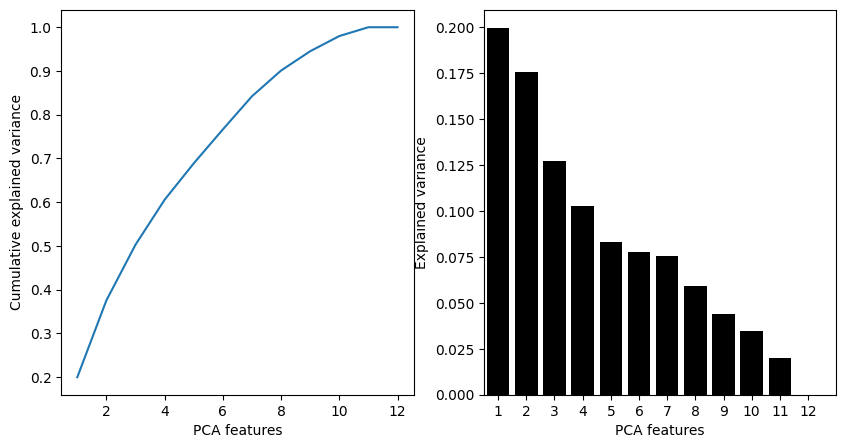

In [6]:
# scale data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
pca = PCA().fit(X_scaled)
X_pca = pca.fit_transform(X_scaled)

features = range(1, pca.n_components_ + 1)

# Plot cummulative explained variance
plt.style.use('default')
fig, axs = plt.subplots(1, 2, figsize = (10, 5))
axs[0].plot(features, np.cumsum(pca.explained_variance_ratio_))
axs[0].set_xlabel('PCA features')
axs[0].set_ylabel('Cumulative explained variance')

# Plot the explained variances
axs[1].bar(features, pca.explained_variance_ratio_, color='black')
axs[1].set_xlim(0.5, 13)
axs[1].xaxis.set_ticks(np.arange(1, 13, 1))
axs[1].set_xlabel('PCA features')
axs[1].set_ylabel('Explained variance')

# https://github.com/gaurav-kaushik/Data-Visualizations-Medium/blob/master/code/Interactive_PCA_and_Feature_Correlation.ipynb
cumsum_pca = np.cumsum(pca.explained_variance_ratio_)
var_95 = np.argmax(cumsum_pca >= 0.95) + 1
twoD = np.round(cumsum_pca[1], decimals=3)*100 
threeD = np.round(cumsum_pca[2], decimals=3)*100
instances_, var_ =  X.shape
    
print("\n -- Summary --")
print(f"95% of variance is explained by {var_95} of the {var_} dimensions")
print(f"2 principal components explain {twoD:.2f}% of variance.")
print(f"3 principal components explain {threeD:.2f}% of variance.")

df_PCA = pd.DataFrame({'dimension': list(range(1, var_ + 1)), 
                       'variance_cumulative': cumsum_pca, 
                       'variance': pca.explained_variance_ratio_}).set_index(['dimension'])

# TSNE dimension reduction

In [16]:
# FAST TNSE
from fast_tsne import fast_tsne
for p in [5, 30, 50, 100, 1000, 10000]:
    %time Z = fast_tsne(X, perplexity = p)
    pickle.dump(Z, open('models/ftz_daily_{}.pkl'.format(p), 'wb'))

CPU times: user 79 ms, sys: 40.3 ms, total: 119 ms
Wall time: 1min 8s
CPU times: user 61.6 ms, sys: 46.1 ms, total: 108 ms
Wall time: 56.8 s
CPU times: user 75.6 ms, sys: 32.2 ms, total: 108 ms
Wall time: 51.3 s
CPU times: user 62.9 ms, sys: 44.1 ms, total: 107 ms
Wall time: 49.3 s
CPU times: user 78.3 ms, sys: 44.4 ms, total: 123 ms
Wall time: 7min 23s
CPU times: user 71.9 ms, sys: 40.1 ms, total: 112 ms
Wall time: 94.4 ms


In [17]:
df = pd.read_pickle('data/nem_formatted_data.pkl')

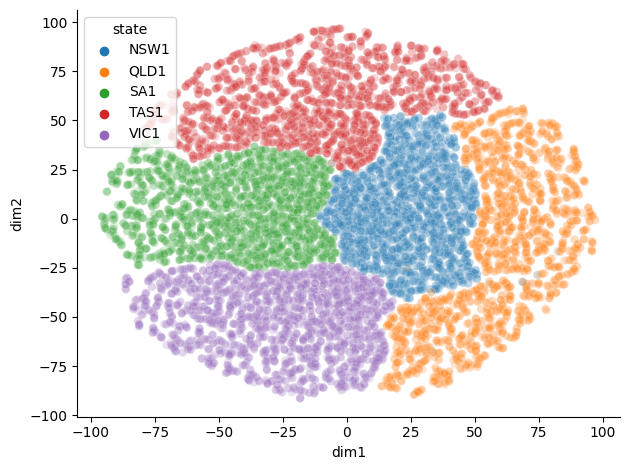

In [18]:
plt.style.use('default')

Z = pd.DataFrame(pickle.load(open('results/ftz_daily_5.pkl', 'rb')))
Z = Z.rename(columns={0: "dim1", 1: "dim2"})
Z['state'] = df['state'].astype('str').astype('category')

sns.scatterplot(x="dim1", y="dim2", hue="state", data=Z, edgecolors='none', alpha = 0.1)
sns.despine()
plt.tight_layout()

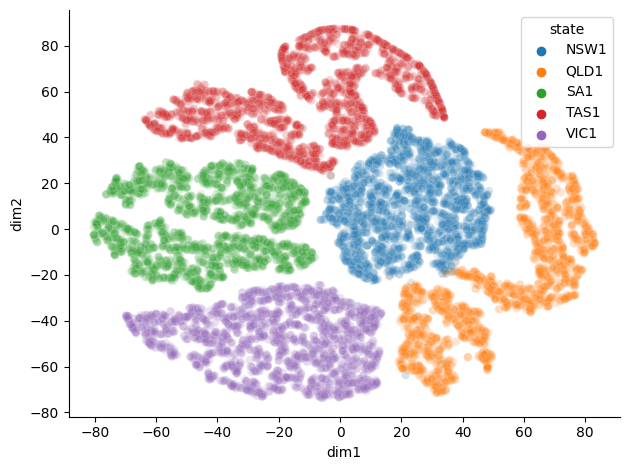

In [19]:
Z = pd.DataFrame(pickle.load(open('results/ftz_daily_30.pkl', 'rb')))
Z = Z.rename(columns={0: "dim1", 1: "dim2"})
Z['state'] = df['state'].astype('str').astype('category')

sns.scatterplot(x="dim1", y="dim2", hue="state", data=Z, edgecolors='none', alpha = 0.1)
sns.despine()
plt.tight_layout()

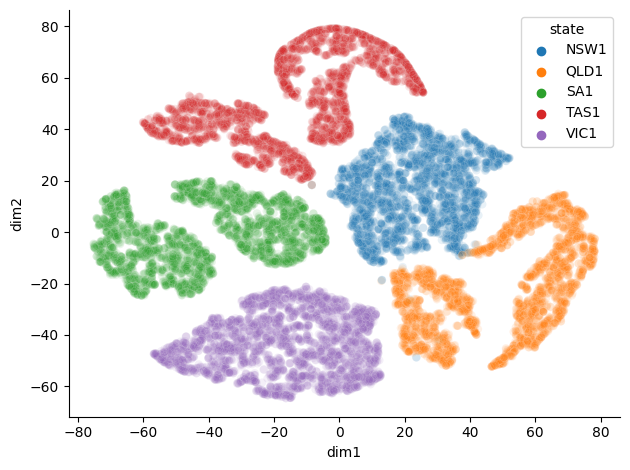

In [20]:
Z = pd.DataFrame(pickle.load(open('results/ftz_daily_50.pkl', 'rb')))
Z = Z.rename(columns={0: "dim1", 1: "dim2"})
Z['state'] = df['state'].astype('str').astype('category')

sns.scatterplot(x="dim1", y="dim2", hue="state", data=Z, edgecolors='none', alpha = 0.1)
sns.despine()
plt.tight_layout()

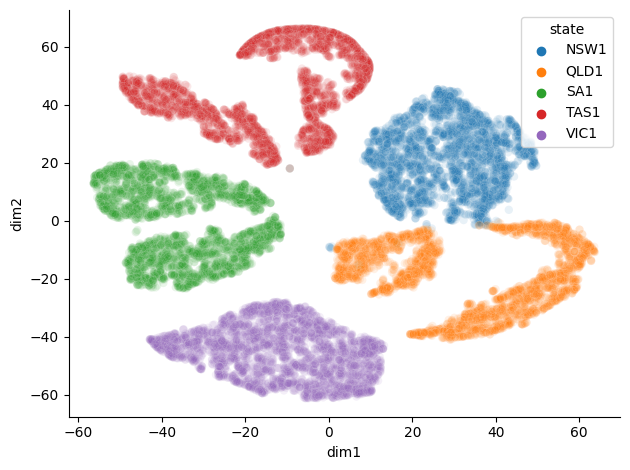

In [21]:
Z = pd.DataFrame(pickle.load(open('results/ftz_daily_100.pkl', 'rb')))
Z = Z.rename(columns={0: "dim1", 1: "dim2"})
Z['state'] = df['state'].astype('str').astype('category')

sns.scatterplot(x="dim1", y="dim2", hue="state", data=Z, edgecolors='none', alpha = 0.1)
sns.despine()
plt.tight_layout()

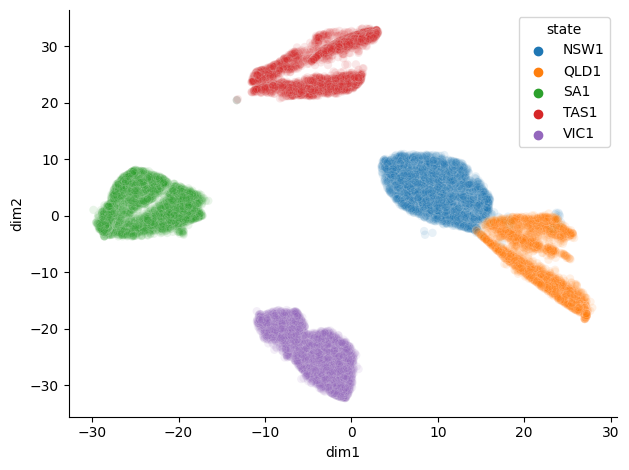

In [22]:
Z = pd.DataFrame(pickle.load(open('results/ftz_daily_1000.pkl', 'rb')))
Z = Z.rename(columns={0: "dim1", 1: "dim2"})
Z['state'] = df['state'].astype('str').astype('category')
sns.scatterplot(x="dim1", y="dim2", hue="state", data=Z, edgecolors='none', alpha = 0.1)
sns.despine()
plt.tight_layout()

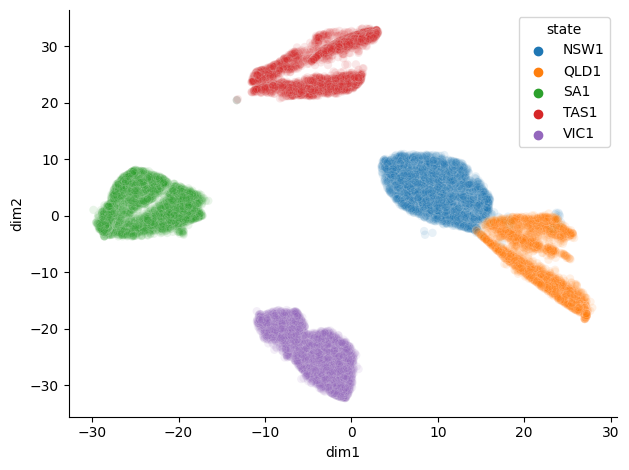

In [23]:
Z = pd.DataFrame(pickle.load(open('results/ftz_daily_10000.pkl', 'rb')))
Z = Z.rename(columns={0: "dim1", 1: "dim2"})
Z['state'] = df['state'].astype('str').astype('category')
sns.scatterplot(x="dim1", y="dim2", hue="state", data=Z, edgecolors='none', alpha = 0.1)
sns.despine()
plt.tight_layout()